# Processing the new QC file we created from the raw Single Cell data in to clusters

## Imports

In [15]:
import numpy as np
import scanpy as sc
import os
import pandas as pd
#import bbknn

## Single Cell settings

In [3]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(80) 
sc.settings.file_format_figures = 'png'
sc.settings.savefigs = False
use_first_n_samples = 0
full_sparse = False

C:\Users\TzachiHNB12\AppData\Local\Temp\ipykernel_6792\738880785.py:2: FutureWarning: The specified parameters ('scanpy',) are no longer positional. Please specify them like `scanpy=80`
  sc.settings.set_figure_params(80)


## Defining a function for processing the data & determing the parameters

In [4]:
def processing_batch(adata, neighbors=15, key='batch', reso=0.4, random_state=0):  # Higher resolution yields more leiden clusters 
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack')
    sc.logging.print_memory_usage()
    sc.pp.neighbors(adata, n_neighbors=neighbors)
    sc.pl.pca_variance_ratio(adata, log=True)
    bbknn.bbknn(adata, batch_key=key, neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=reso)
    sc.pl.umap(adata, color='leiden')

## Reading the excisting h5ad file I created previously in the QC pipeline 

In [5]:
#adata after QC
adata = sc.read(r'/Code/data/single_cell/animals/frog/new_mapping_11_2024/frog_2/''f2_ncbi_QC.h5ad') 

sc.read_h5ad(r'/Code/data/single_cell/animals/frog/new_mapping_11_2024/frog_2/''f2_ncbi_QC.h5ad')

# If the anndata object is processed and contains the raw data in adata.raw run -  adata = adata.raw.to_adata()

AnnData object with n_obs × n_vars = 39927 × 42755
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT'
    var: 'gene_ids', 'feature_types', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

## Processing the data 

In [6]:
adata

AnnData object with n_obs × n_vars = 39927 × 42755
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT'
    var: 'gene_ids', 'feature_types', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

In [7]:
adata.obs

,treatment,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT
AAACCCAAGCAGCCCT-1-UNST,UNST,408,408,686.0,55.0,8.017493
AAACCCAAGCATAGGC-1-UNST,UNST,1555,1555,3807.0,21.0,0.551615
AAACCCAAGCCATCCG-1-UNST,UNST,1308,1308,3156.0,33.0,1.045627
AAACCCAAGCGTATGG-1-UNST,UNST,622,622,1339.0,105.0,7.841673
AAACCCAAGGCGCTTC-1-UNST,UNST,1248,1248,2919.0,64.0,2.192532
...,...,...,...,...,...,...
TTTGTTGGTCCACTTC-1-PIC,PIC,337,337,565.0,57.0,10.088496
TTTGTTGGTGGACCTC-1-PIC,PIC,300,300,502.0,0.0,0.000000
TTTGTTGTCCAAGCCG-1-PIC,PIC,1593,1593,3981.0,21.0,0.527506
TTTGTTGTCCATACAG-1-PIC,PIC,1358,1358,2948.0,36.0,1.221167


In [8]:
adata.var

,gene_ids,feature_types,MT,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
LOC108704873,LOC108704873,Gene Expression,False,0,0.000000,100.000000,0.0
LOC108704861,LOC108704861,Gene Expression,False,0,0.000000,100.000000,0.0
dok1.L,dok1.L,Gene Expression,False,3052,0.079763,92.877812,3418.0
mrps26.L,mrps26.L,Gene Expression,False,4926,0.137730,88.504621,5902.0
LOC108704862,LOC108704862,Gene Expression,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...
MT-ND6,ND6,Gene Expression,True,1104,0.027420,97.423691,1175.0
unassigned_gene_22,unassigned_gene_22,Gene Expression,False,8,0.000187,99.981331,8.0
MT-CYTB,CYTB,Gene Expression,True,39623,5.068445,7.535238,217193.0
unassigned_gene_23,unassigned_gene_23,Gene Expression,False,43,0.001003,99.899655,43.0


### Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    Gene indices [ 7491 17502 34224] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


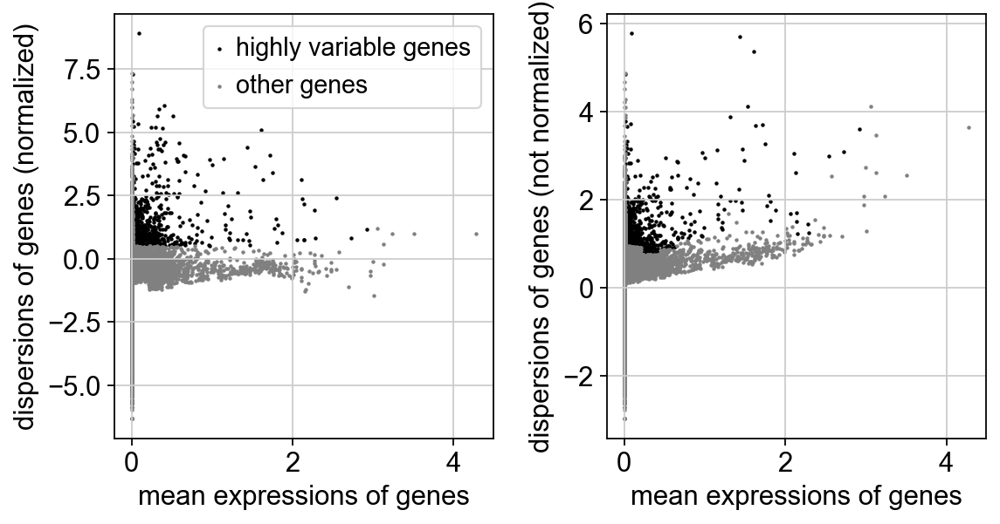

In [9]:
# Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations.

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata
# adata = adata[:, adata.var.highly_variable] # For filtering non Highly variable genes. We usually keep all the genes. 

In [10]:
sc.pp.regress_out(adata, ['total_counts','pct_counts_MT'])

# Got it from: https://github.com/theislab/single-cell-tutorial/issues/35
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata) 

regressing out ['total_counts', 'pct_counts_MT']
    sparse input is densified and may lead to high memory use
    finished (0:42:43)
    ... clipping at max_value 10
computing PCA


c:\Python\Python312\Lib\site-packages\scanpy\preprocessing\_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    with n_comps=50
    finished (0:00:14)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:01:55)


c:\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    computed connectivities (0:00:07)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:03)
computing UMAP


  0%|          | 1/200 [00:02<07:27,  2.25s/it]

	completed  0  /  200 epochs


 11%|█         | 22/200 [00:08<00:59,  2.98it/s]

	completed  20  /  200 epochs


 20%|██        | 41/200 [00:15<00:53,  2.98it/s]

	completed  40  /  200 epochs


 30%|███       | 61/200 [00:22<00:55,  2.51it/s]

	completed  60  /  200 epochs


 40%|████      | 81/200 [00:29<00:40,  2.96it/s]

	completed  80  /  200 epochs


 50%|█████     | 101/200 [00:35<00:32,  3.07it/s]

	completed  100  /  200 epochs


 60%|██████    | 121/200 [00:42<00:27,  2.92it/s]

	completed  120  /  200 epochs


 71%|███████   | 142/200 [00:50<00:23,  2.48it/s]

	completed  140  /  200 epochs


 81%|████████  | 162/200 [00:57<00:16,  2.24it/s]

	completed  160  /  200 epochs


 91%|█████████ | 182/200 [01:06<00:06,  2.78it/s]

	completed  180  /  200 epochs


100%|██████████| 200/200 [01:13<00:00,  2.71it/s]

    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:01:24)


In [ ]:
import bbknn
processing_batch(adata, key='treatment')

ModuleNotFoundError: No module named 'bbknn'

### Ranking genes ( = top 20)

ranking genes
    consider 'treatment' groups:
    with sizes: [ 9201 11056 10893  6969]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:07)


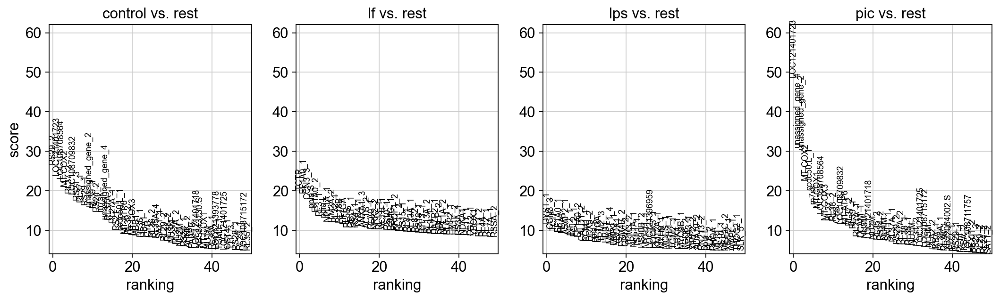

,control,lf,lps,pic
0,RS29_2,TCTP,DYST_1,LOC121401723
1,LOC121401723,EF1A0_1,CCN3_3,unassigned_gene_4
2,LOC108708564,CCN3_3,TCTP,unassigned_gene_2
3,MT-COX2,ppia.S,EF1A0_1,MT-COX2
4,RL37_2,EF1A0_2,HBA1,ccdc50.L_1
5,LOC108709832,RL3_1,ASAP2_1,rn7sk
6,RS21_3,ppia.L,INF2_1,MT-COX1
7,RL37_1,NPL1A_1,FGL2_1,LOC108708564
8,RS29_1,ITM2A_2,EF1A0_2,MT-COX3
9,unassigned_gene_2,RL32_1,CALD1_2,RL37_1


In [12]:
sc.tl.rank_genes_groups(adata, groupby='treatment', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=True)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

# sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color = ['PLAC8', 'CD83', 'CD74', 'CD79B', 'CD38', 'IL10', 'CD7'], size=50)

In [13]:
adata.obs['treatment'].value_counts()

treatment
lf         11056
lps        10893
control     9201
pic         6969
Name: count, dtype: int64

### UMAP's

#### T cells

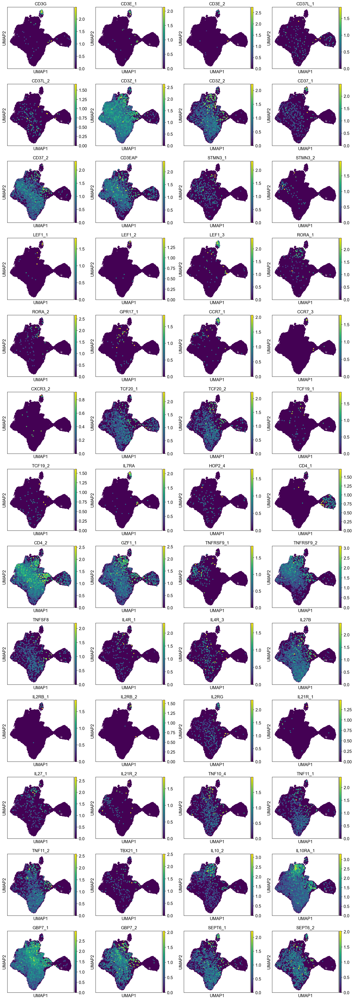

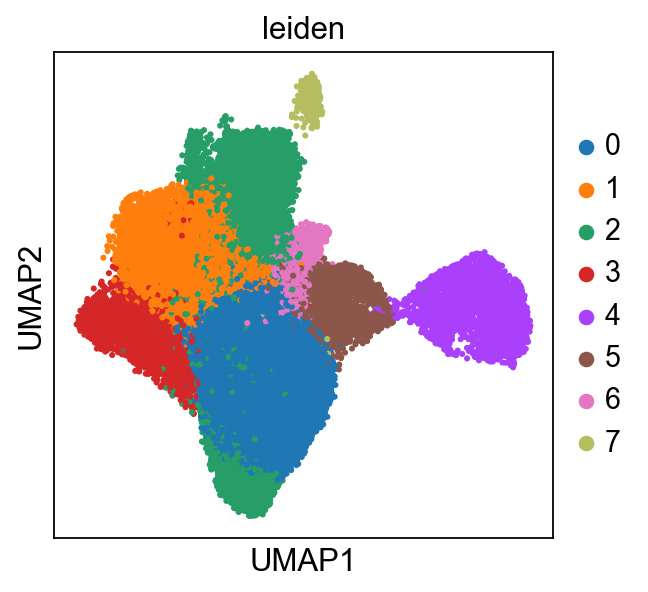

In [14]:
# T cells. 'CCR7' is a marker for T cells and also B cells. Markers from Roy's Extended_Data_Figures.
# Markers for T cells https://www.beckman.com/resources/cell-types/blood-cells/leukocytes/lymphocytes/t-cells
sc.pl.umap(adata, color=['CD3G','CD3E_1','CD3E_2','CD37L_1','CD37L_2','CD3Z_1',
                         'CD3Z_2','CD37_1','CD37_2','CD3EAP','STMN3_1',
                         'STMN3_2','LEF1_1','LEF1_2','LEF1_3','RORA_1','RORA_2',
                         'GPR17_1','CCR7_1','CCR7_3','CXCR3_2','TCF20_1',
                         'TCF20_2','TCF19_1','TCF19_2','IL7RA','HOP2_4','CD4_1',
                         'CD4_2','GZF1_1','TNFRSF9_1','TNFRSF9_2','TNFSF8',
                         'IL4R_1','IL4R_3','IL27B','IL2RB_1','IL2RB_2','IL2RG',
                         'IL21R_1','IL27_1','IL21R_2','TNF10_4','TNF11_1','TNF11_2',
                         'TBX21_1','IL10_2','IL10RA_1','GBP7_1','GBP7_2',
                         'SEPT6_1','SEPT6_2'], size=50)

sc.pl.umap(adata, color='leiden', size=30)

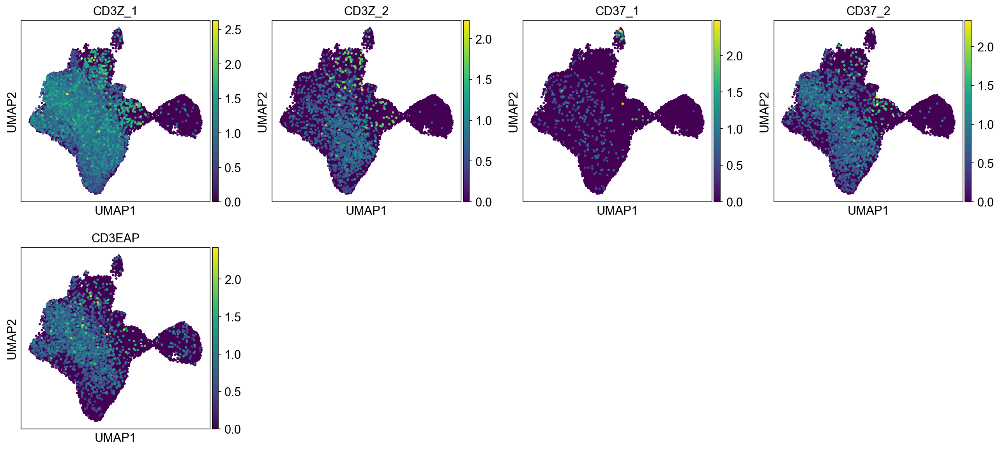

In [26]:
sc.pl.umap(adata, color=['CD3Z_1','CD3Z_2','CD37_1','CD37_2','CD3EAP'], size=30)

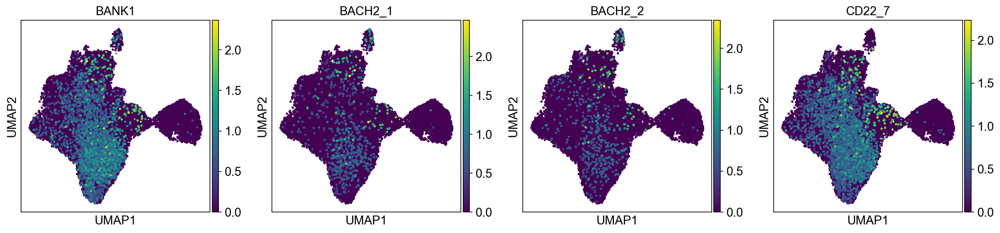

In [28]:
sc.pl.umap(adata, color=['BANK1','BACH2_1','BACH2_2','CD22_7'], size=30)

#### B cells

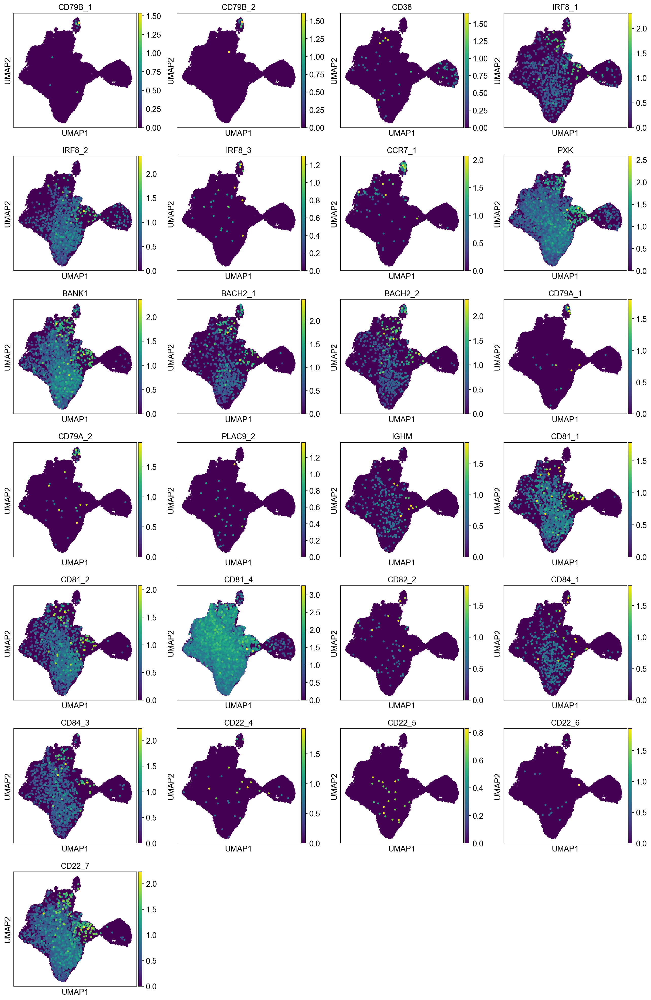

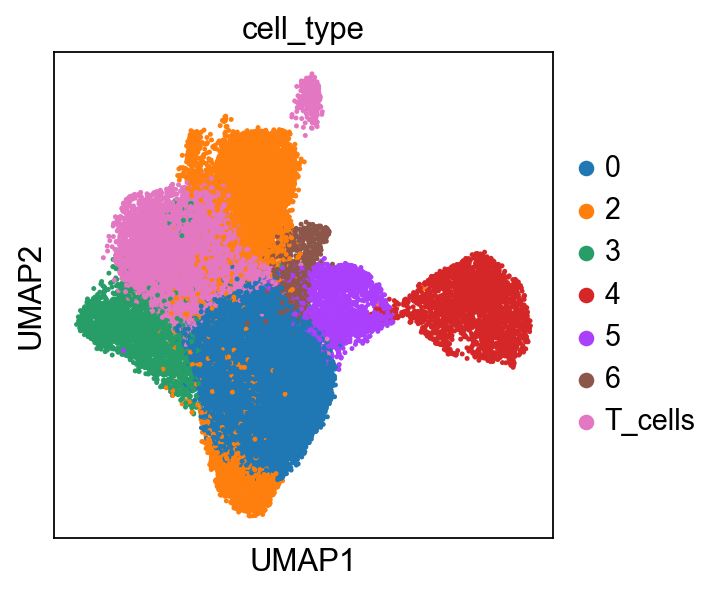

In [15]:
# B cells markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['CD79B_1','CD79B_2','CD38','IRF8_1','IRF8_2','IRF8_3',
                         'CCR7_1','PXK','BANK1','BACH2_1','BACH2_2','CD79A_1',
                         'CD79A_2','PLAC9_2','IGHM','CD81_1','CD81_2','CD81_4',
                         'CD82_2','CD84_1','CD84_3','CD22_4','CD22_5','CD22_6',
                         'CD22_7'], size=50)

celltype = {'0':'0','1':'T_cells','2':'2','3':'3','4':'4','5':'5','6':'6','7':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### RBC

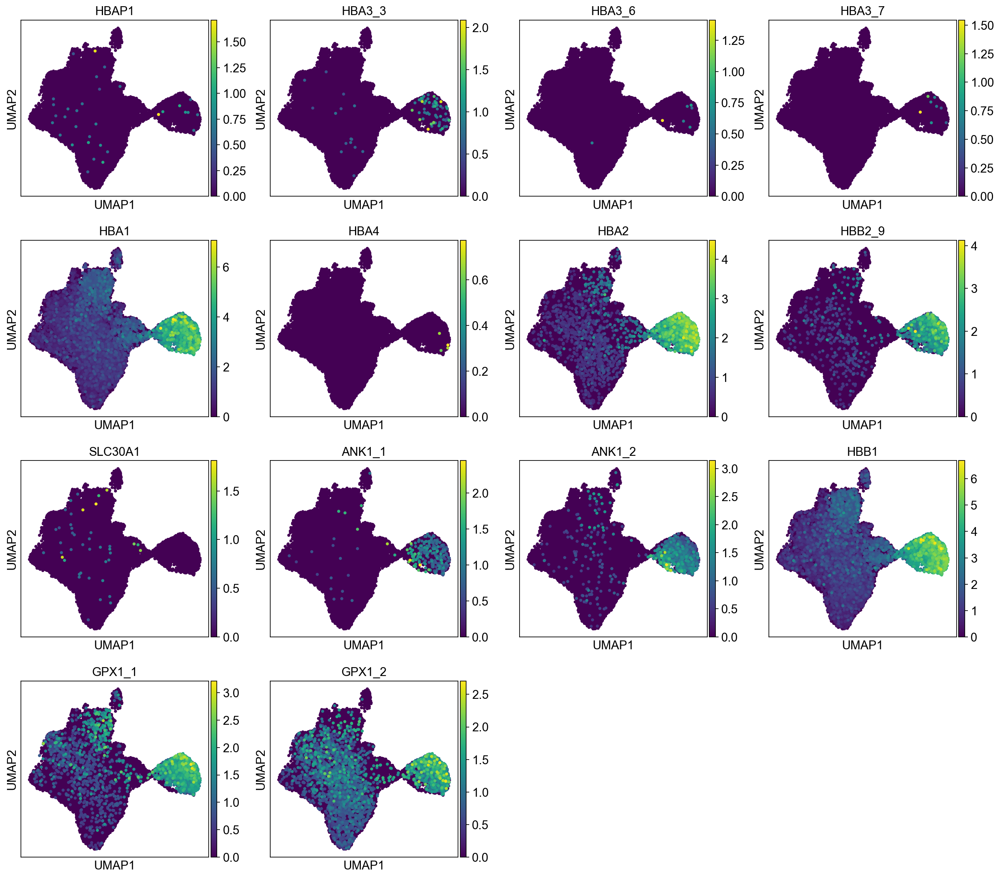

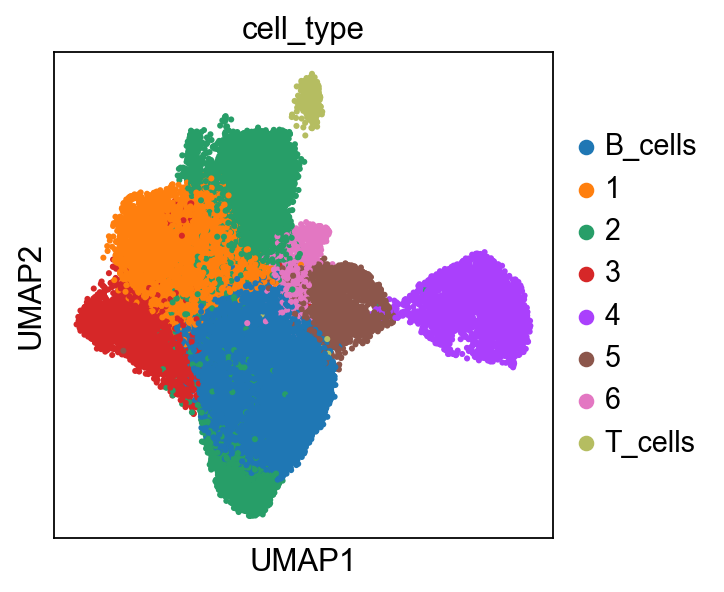

In [18]:
# RBC markers from Roy's data and from https://panglaodb.se/markers

sc.pl.umap(adata, color=['HBAP1','HBA3_3','HBA3_6','HBA3_7','HBA1','HBA4','HBA2','HBB2_9',
                         'SLC30A1','ANK1_1','ANK1_2','HBB1','GPX1_1','GPX1_2'], size=50)

celltype = {'0':'B_cells','1':'1','2':'2','3':'3','4':'4','5':'5','6':'6','7':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### Platelets

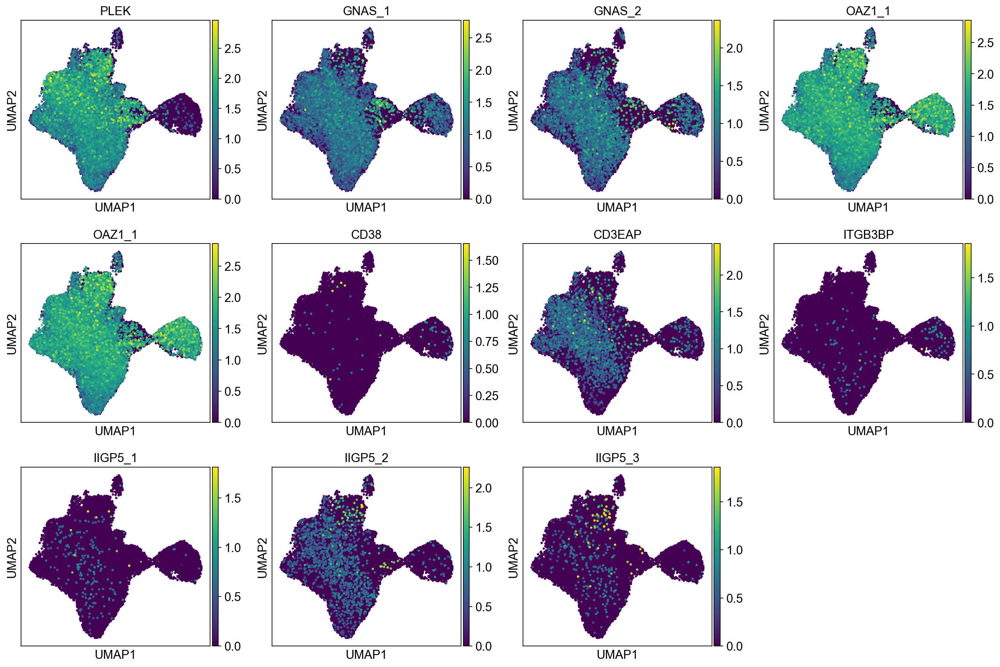

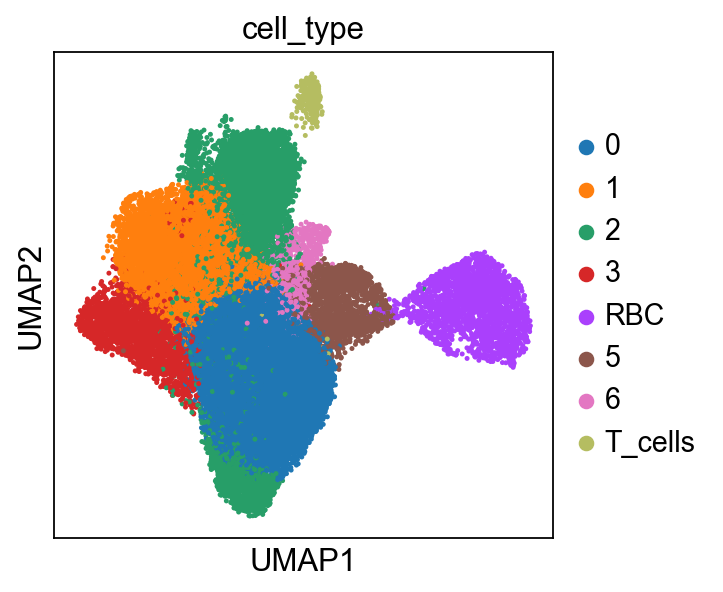

In [16]:
# Platelets markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['PLEK','GNAS_1','GNAS_2','OAZ1_1','OAZ1_1','CD38',
                         'CD3EAP','ITGB3BP','IIGP5_1','IIGP5_2','IIGP5_3'], size=30)

celltype = {'0':'0','1':'1','2':'2','3':'3','4':'RBC','5':'5','6':'6','7':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### Monocytes

In [ ]:
# Monocytes markers from Roy's data and from https://panglaodb.se/markers

sc.pl.umap(adata, color=['S100A11','TET2_1','TET2_1','TLR4','CCR2','TXNL1_1',
                         'TXNL1_2','TXND9','TXN4B','TXND5_1','TXND5_2','TXN4A',
                         'TXNIP_1','TXNIP_2','MAFB_1','MAFB_2','PPA5_1',
                         'GBP1_2','IRF3_1','IRF3_2','IRF3_3','PLS1_1','PLS1_3',
                         'PLS1_4','PLS1_6','PLS1_10','RGS12_1','RGS12_2','RGS14_1',
                         'RGS14_2','RGS1_1','RGS18_2','RGS1_2','RGS10_1','RGS19_1',
                         'RGS19_2','IFIT5_13','IFIT5_14','IFIT5_15','RSAD2_1',
                         'RSAD2_2','ZNFX1_1','ZNFX1_2','IFIH1','PARP1','CMPK2_1',
                         'CMPK2_2'], size=50)

celltype = {'0':'0','1':'1','2':'2','3':'3','4':'RBC','5':'5','6':'6','7':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### All clusters

In [ ]:
celltype = {'0':'B_cells','1':'T_cells','2':'Monocytes','3':'3','4':'RBC','5':'Monocytes','6':'Monocytes','7':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=50)

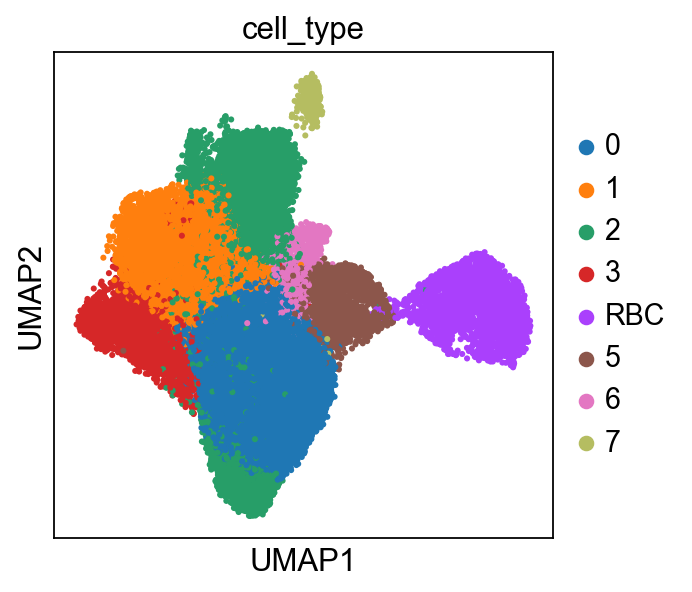

In [17]:
celltype = {'0':'0','1':'1','2':'2','3':'3','4':'RBC','5':'5','6':'6','7':'7'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

In [ ]:
adata.obs['cell_type'].value_counts()

In [ ]:
sc.pl.umap(adata, color=['CD1A'], size=50)
sc.pl.umap(adata, color='cell_type', size=50)

### ISG genes 

In [ ]:
df_isg_genes = pd.read_csv('/Code/data/single_cell/animals/frog/frog_2/laevis/ISG_genes_frog_2_african.csv', index_col=0)
df_isg_genes = df_isg_genes.sort_index()

df_isg_genes

In [ ]:
isg_genes_list = df_isg_genes.index.tolist()
isg_genes_list

#### UMAP's of the ISG genes

In [ ]:
# celltype = {'0':'Platelets','1':'T_cells','2':'B_cells','3':'Monocytes','4':'T_cells','5':'RBC','6':'Monocytes'}
# adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color=isg_genes_list, size=50)

#### Dotplot of the ISG genes in expressed in turtle

In [ ]:
sc.pl.dotplot(adata, isg_genes_list, groupby='treatment', standard_scale='var')

## Gene search tools
This function returns a list of genes that are present in adata (markers for example) from an input of a general list.

In [20]:
def find_gene(gene):
    GENES = list(adata.raw.var.index[adata.raw.var.index.str.startswith(gene.upper())])
    return GENES

find_gene('cd3')

['CD38',
 'CD37L_1',
 'CD37L_2',
 'CD3Z_1',
 'CD3Z_2',
 'CD34_2',
 'CD3E_1',
 'CD37_1',
 'CD3G',
 'CD3E_2',
 'CD37_2',
 'CD3EAP',
 'CD302']

In [ ]:
sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color='TLR4', size=50)
sc.pl.dotplot(adata, 'TLR4', groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'lps'], color='TLR4', size=50)
sc.pl.dotplot(adata, 'TLR4', groupby='treatment', standard_scale='var')